**I am doing a project on image denoising using convolutional auto encoder**

# Image Denoising Using Convolutional Autoencoder

This project implements an image denoising model using a convolutional autoencoder. The model is trained on the BSDS500 dataset by adding artificial noise to clean images and learning how to reconstruct the original clean images.

The project evaluates denoising performance using visual comparison and quantitative metrics such as MSE, PSNR, and SSIM.

In [1]:
# Imports and Reproducibility
import os
import math
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt


seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)


In [2]:
# Downloading and extracting the BSDS500
!wget https://github.com/BIDS/BSDS500/archive/refs/heads/master.zip
!unzip master.zip

--2026-05-14 21:39:09--  https://github.com/BIDS/BSDS500/archive/refs/heads/master.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/BIDS/BSDS500/zip/refs/heads/master [following]
--2026-05-14 21:39:09--  https://codeload.github.com/BIDS/BSDS500/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.113.9
Connecting to codeload.github.com (codeload.github.com)|140.82.113.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [        <=>         ] 160.04M  14.5MB/s    in 9.0s    

2026-05-14 21:39:18 (17.8 MB/s) - ‘master.zip’ saved [167818480]

Archive:  master.zip
a04b7c6c3a9f0ace74bf205c72a43d32e1c72722
   creating: BSDS500-master/
   creating: BSDS500-master/BSDS500/
   creating: BSDS500-master/B

In [3]:
# Dataset paths
train_dir = "/content/BSDS500-master/BSDS500/data/images/train"
val_dir   = "/content/BSDS500-master/BSDS500/data/images/val"
test_dir  = "/content/BSDS500-master/BSDS500/data/images/test"

In [4]:
#Verifying the dataset
for folder_name, folder_path in {
    "Train": train_dir,
    "Validation": val_dir,
    "Test": test_dir
}.items():
    print(f"{folder_name} path exists: {os.path.exists(folder_path)}")
    print(f"{folder_name} image count: {len(os.listdir(folder_path))}")
    print("=" * 30)


Train path exists: True
Train image count: 201
Validation path exists: True
Validation image count: 101
Test path exists: True
Test image count: 201


We are going to import the required devices for this project

In [5]:
#Device Configuration
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

Using device: cpu


Now i will be customizing dataset for BSDS500

In [6]:
#Customizing dataset for Image Denoising
class BSDDenoisingDataset(Dataset):
    def __init__(self, root_dir, image_size=(128, 128), noise_factor=0.1):
        self.root_dir = root_dir
        self.noise_factor = noise_factor
        self.image_paths = []

        for fname in os.listdir(root_dir):
            if fname.lower().endswith((".jpg", ".jpeg", ".png", ".bmp")):
                self.image_paths.append(os.path.join(root_dir, fname))

        self.image_paths.sort()

        self.transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        clean_image = self.transform(image)

        noise = torch.randn_like(clean_image) * self.noise_factor
        noisy_image = clean_image + noise
        noisy_image = torch.clamp(noisy_image, 0.0, 1.0)

        return noisy_image, clean_image

In [7]:
#Creating Datasets and DataLoaders
image_size = (128, 128)
noise_factor = 0.1

train_dataset = BSDDenoisingDataset(train_dir, image_size=image_size, noise_factor=noise_factor)
val_dataset   = BSDDenoisingDataset(val_dir, image_size=image_size, noise_factor=noise_factor)
test_dataset  = BSDDenoisingDataset(test_dir, image_size=image_size, noise_factor=noise_factor)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=50, shuffle=False, num_workers=2, pin_memory=True)

print("Train images:", len(train_dataset))
print("Validation images:", len(val_dataset))
print("Test images:", len(test_dataset))

Train images: 200
Validation images: 100
Test images: 200


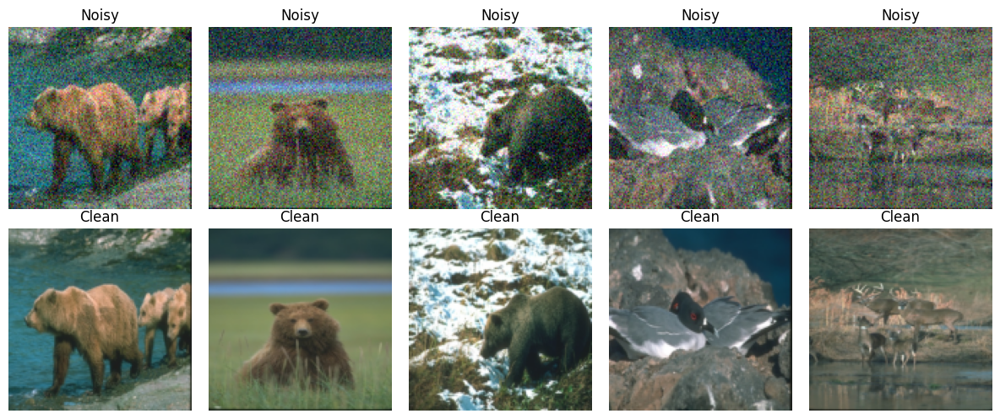

In [8]:
#Visualizing sample Noisy and Clean Images
def show_sample_data(dataset, num_images=5):
    plt.figure(figsize=(12, 5))

    for i in range(num_images):
        noisy_img, clean_img = dataset[i]

        plt.subplot(2, num_images, i + 1)
        plt.imshow(noisy_img.permute(1, 2, 0))
        plt.title("Noisy")
        plt.axis("off")

        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(clean_img.permute(1, 2, 0))
        plt.title("Clean")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_sample_data(train_dataset, num_images=5)


In [9]:
#Convolutional Autoencoder Model
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=2, stride=2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

model = ConvAutoencoder().to(device)
print(model)

ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
    (3): ReLU()
    (4): ConvTranspose2d(32, 3, kernel_size=(2, 2), stride=(2, 2))
    (5): Sigmoid()
  )
)


In [10]:
#Loss Function and Optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [11]:
#Training Function
def train_model(model, train_loader, val_loader, criterion, optimizer, epochs=20):
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        model.train()
        running_train_loss = 0.0

        for noisy_imgs, clean_imgs in train_loader:
            noisy_imgs = noisy_imgs.to(device, non_blocking=True)
            clean_imgs = clean_imgs.to(device, non_blocking=True)

            optimizer.zero_grad()
            outputs = model(noisy_imgs)
            loss = criterion(outputs, clean_imgs)
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item() * noisy_imgs.size(0)

        epoch_train_loss = running_train_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        model.eval()
        running_val_loss = 0.0

        with torch.no_grad():
            for noisy_imgs, clean_imgs in val_loader:
                noisy_imgs = noisy_imgs.to(device, non_blocking=True)
                clean_imgs = clean_imgs.to(device, non_blocking=True)

                outputs = model(noisy_imgs)
                loss = criterion(outputs, clean_imgs)
                running_val_loss += loss.item() * noisy_imgs.size(0)

        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)

        print(f"Epoch [{epoch+1}/{epochs}] | Train Loss: {epoch_train_loss:.6f} | Val Loss: {epoch_val_loss:.6f}")

    return train_losses, val_losses

In [12]:
#Training The Model
train_losses, val_losses = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=20
)


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch [1/20] | Train Loss: 0.070583 | Val Loss: 0.068740
Epoch [2/20] | Train Loss: 0.061173 | Val Loss: 0.050851
Epoch [3/20] | Train Loss: 0.037767 | Val Loss: 0.030791
Epoch [4/20] | Train Loss: 0.027891 | Val Loss: 0.025361
Epoch [5/20] | Train Loss: 0.023363 | Val Loss: 0.020849
Epoch [6/20] | Train Loss: 0.020150 | Val Loss: 0.017840
Epoch [7/20] | Train Loss: 0.018065 | Val Loss: 0.016114
Epoch [8/20] | Train Loss: 0.016447 | Val Loss: 0.014774
Epoch [9/20] | Train Loss: 0.014973 | Val Loss: 0.013047
Epoch [10/20] | Train Loss: 0.013336 | Val Loss: 0.012325
Epoch [11/20] | Train Loss: 0.012251 | Val Loss: 0.011571
Epoch [12/20] | Train Loss: 0.011368 | Val Loss: 0.010389
Epoch [13/20] | Train Loss: 0.010484 | Val Loss: 0.009732
Epoch [14/20] | Train Loss: 0.010024 | Val Loss: 0.009390
Epoch [15/20] | Train Loss: 0.009688 | Val Loss: 0.009043
Epoch [16/20] | Train Loss: 0.009318 | Val Loss: 0.009145
Epoch [17/20] | Train Loss: 0.009113 | Val Loss: 0.008545
Epoch [18/20] | Train L

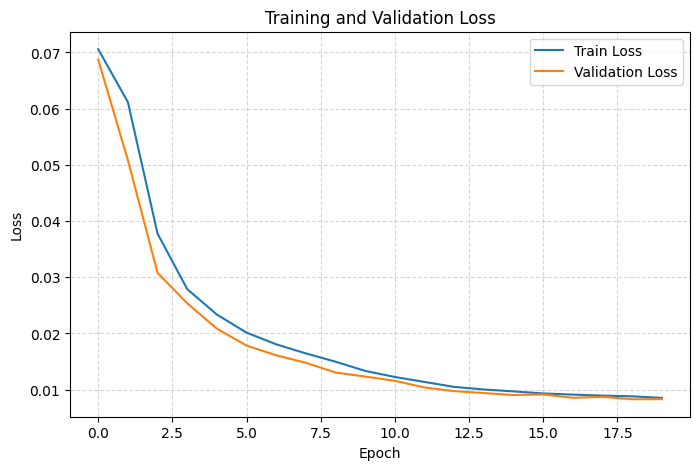

In [13]:
#Plotting Training and Validation Loss
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

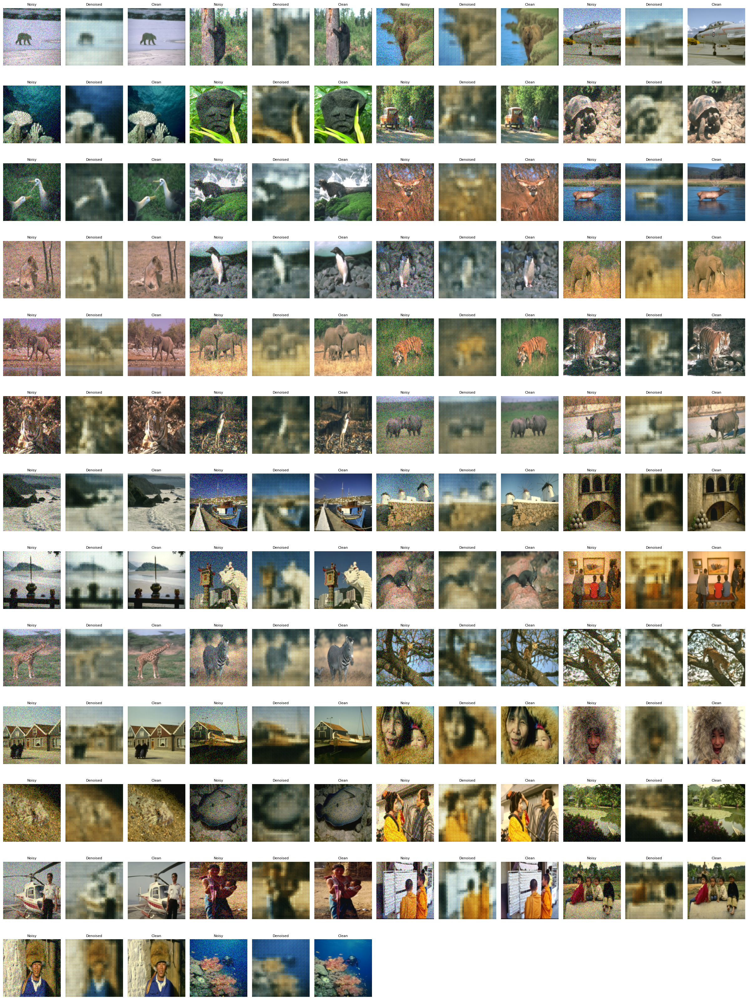

In [14]:
#Showing the Denoising Results in a multi_Row Grid

def show_denoising_results(model, test_loader, num_images=50, samples_per_row=5):
    model.eval()
    noisy_imgs, clean_imgs = next(iter(test_loader))
    noisy_imgs = noisy_imgs.to(device)
    clean_imgs = clean_imgs.to(device)

    with torch.no_grad():
        denoised_imgs = model(noisy_imgs)

    noisy_imgs = noisy_imgs.cpu()
    clean_imgs = clean_imgs.cpu()
    denoised_imgs = denoised_imgs.cpu()

    num_images = min(num_images, len(noisy_imgs))
    rows = math.ceil(num_images/samples_per_row)
    cols = samples_per_row * 3

    plt.figure(figsize=(cols * 2,rows * 2.5))

    for i in range(num_images):
        row = i// samples_per_row
        col_start = (i % samples_per_row) * 3

        # Noisy
        plt.subplot(rows, cols, row*cols + col_start + 1)
        plt.imshow(noisy_imgs[i].permute(1, 2, 0))
        plt.title("Noisy", fontsize =8)
        plt.axis("off")

        # Denoised
        plt.subplot(rows, cols, row*cols + col_start + 2)
        plt.imshow(denoised_imgs[i].permute(1, 2, 0))
        plt.title("Denoised", fontsize=8)
        plt.axis("off")

        #Clean
        plt.subplot(rows, cols, row*cols + col_start + 3)
        plt.imshow(clean_imgs[i].permute(1, 2, 0))
        plt.title("Clean", fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_denoising_results(model, test_loader, num_images=50, samples_per_row=4)